In [35]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas.core.common import SettingWithCopyWarning
from pathlib import Path
from glob import glob
from time import time
import warnings

from utils import *
from model import CNN_m123 as CNN
from train_harcnn import *

warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
plt.rcParams['figure.figsize'] = [30, 30]
np.random.seed(42)


LABEL = {'walk': 2, 'walk_turn': 3, 'jog': 0, 'jog_turn': 1, 'run':4, 'stationary':5}

n_sample = 100


# Power Consumption ([mA]*[V])
PW_GNSS = {
    0: 23,
    1: 33,
    2: 36,
    3: 44,
    4: 45,
    5: 47,
    6: 49,
    7: 51,
    8: 54,
    9: 56,
    10:58
    }
a = 5.8
PW_GNSS = {
    0: a,
    1: a*1,
    2: a*2,
    3: a*3,
    4: a*4,
    5: a*5,
    6: a*6,
    7: a*7,
    8: a*8,
    9: a*9,
    10:58
    }

PW_IMU = {
    0:3,
    10:6,
    20:7,
    25:7,
    33:8,
    50:9,
    100:12,
}

net = CNN(n_classes=6)
net.load_state_dict(torch.load(Path('./models/MyModel.pth')))

<All keys matched successfully>

In [36]:
def show_gps_label(df, idx_start=0, idx_end=None, enu_format=0, annotate=True):
    time = df[['time']][idx_start:idx_end].to_numpy()
    lat  = df[['latitude']][idx_start:idx_end].to_numpy()
    lon  = df[['longitude']][idx_start:idx_end].to_numpy()
    enu_x = df[['enu_x']][idx_start:idx_end].to_numpy()
    enu_y = df[['enu_y']][idx_start:idx_end].to_numpy()
    label = df[['prediction']][idx_start:idx_end].to_numpy()
    
    pos_range = [129.3186, 129.3202, 36.0124, 36.0140] # POSTECH Field

    if(enu_format):
        lat = enu_y
        lon = enu_x
    else:
        #plt.axis(pos_range)
        img = plt.imread("background2.png")
        plt.imshow(img, extent=pos_range)
   # print("DATAFRAME LENGTH: ",len(df))
    for i in range(len(df)):
        #print(label[i])
        # 0 jog forward  = blue
        # 1 jog turn = purple
        # 2 walk forward = green
        # 3 walk turn = olive
        # 4 run = cyian = red
        color = {'walk': 'tab:green',
                 'walk_turn': 'tab:blue',
                 'jog': 'tab:orange',
                 'jog_turn': 'tab:purple',
                 'run': 'tab:red',
                 'stationary': 'tab:cyan',
                }
        markersize=10
        plt.title(color,fontsize=30)
        p = label[i]
        if(p==LABEL['jog']):
            plt.plot(lon[i], lat[i], marker='o', color = color['jog'], markersize=markersize)
        elif(p==LABEL['jog_turn']):
            plt.plot(lon[i], lat[i], marker='o', color = color['jog_turn'], markersize=markersize)
        elif(p==LABEL['walk']):
            plt.plot(lon[i], lat[i], marker='o', color = color['walk'], markersize=markersize)
        elif(p==LABEL['walk_turn']):
            plt.plot(lon[i], lat[i], marker='o', color = color['walk_turn'], markersize=markersize)
        elif(p==LABEL['run']):
            plt.plot(lon[i], lat[i], marker='o', color = color['run'], markersize=markersize)
        elif(p==LABEL['stationary']):
            plt.plot(lon[i], lat[i], marker='o', color = color['stationary'], markersize=markersize)
        else:
            plt.plot(lon[i], lat[i], marker='o', color = 'k', markersize=6)
    
    if(annotate):
        for idx, xy in enumerate(zip(lon,lat)):
            if(idx % 10 == 0):
                plt.annotate('{}'.format(df.index[idx]), xy=xy, textcoords='data', fontsize=40)
                #plt.annotate('{},{:.3f},{:.3f}'.format(idx, xy[0], xy[1]), xy=xy, textcoords='data')

def get_key(val, my_dict):
    return [keys for keys, values in my_dict.items() if val==values][0]


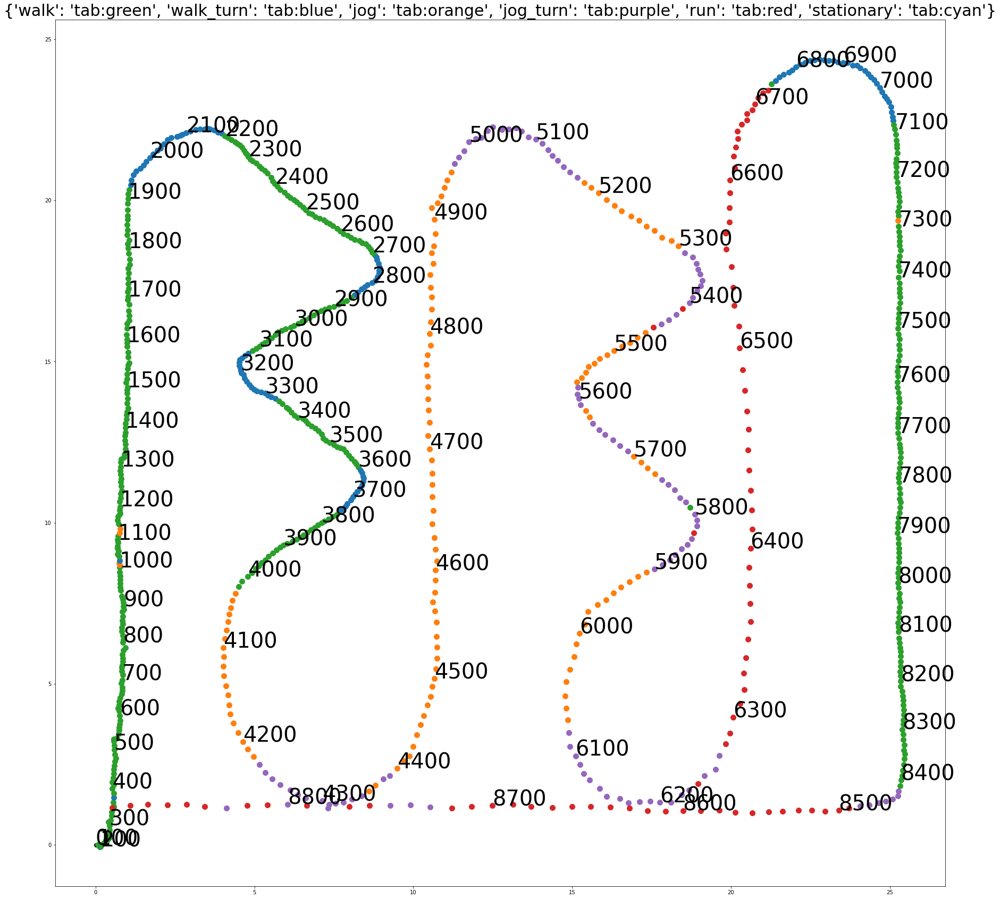

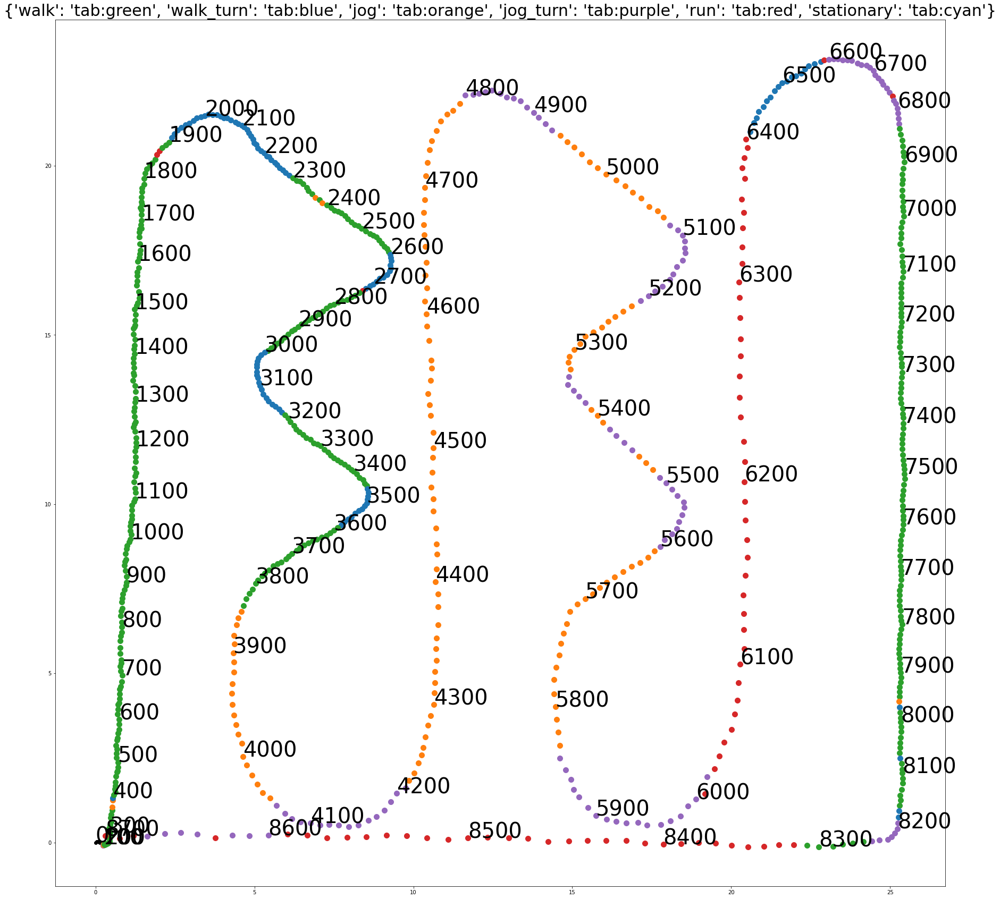

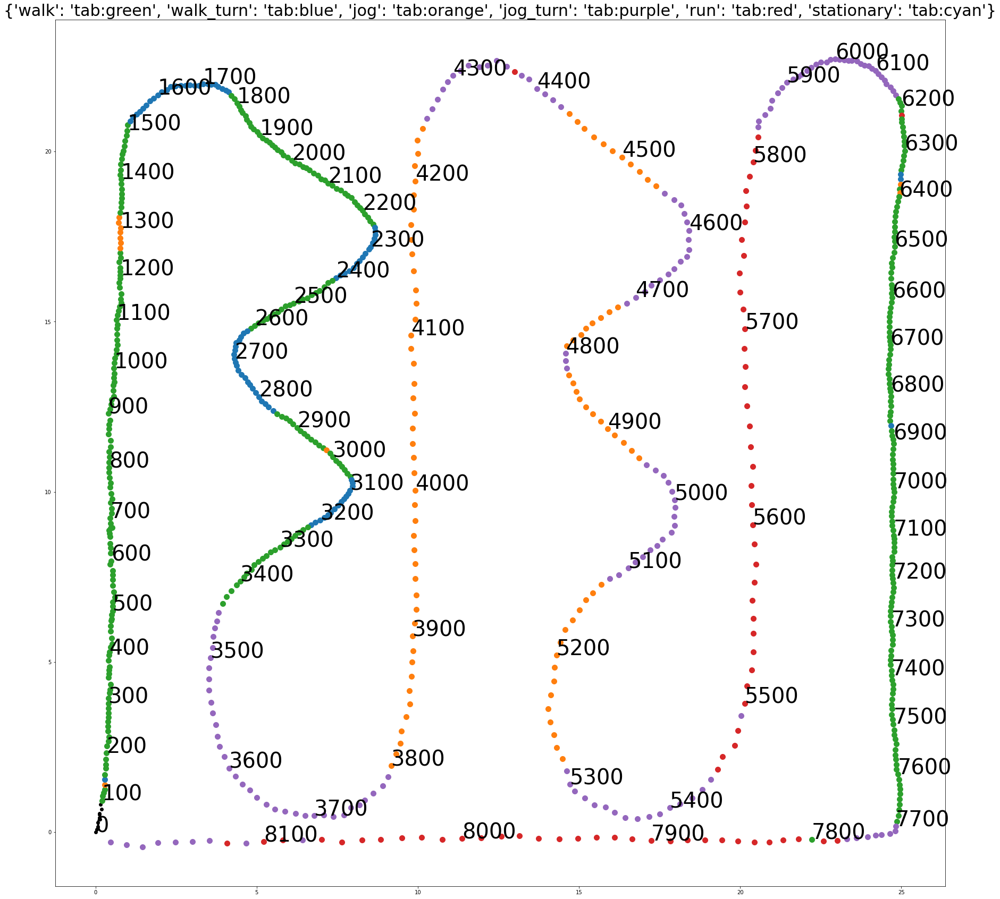

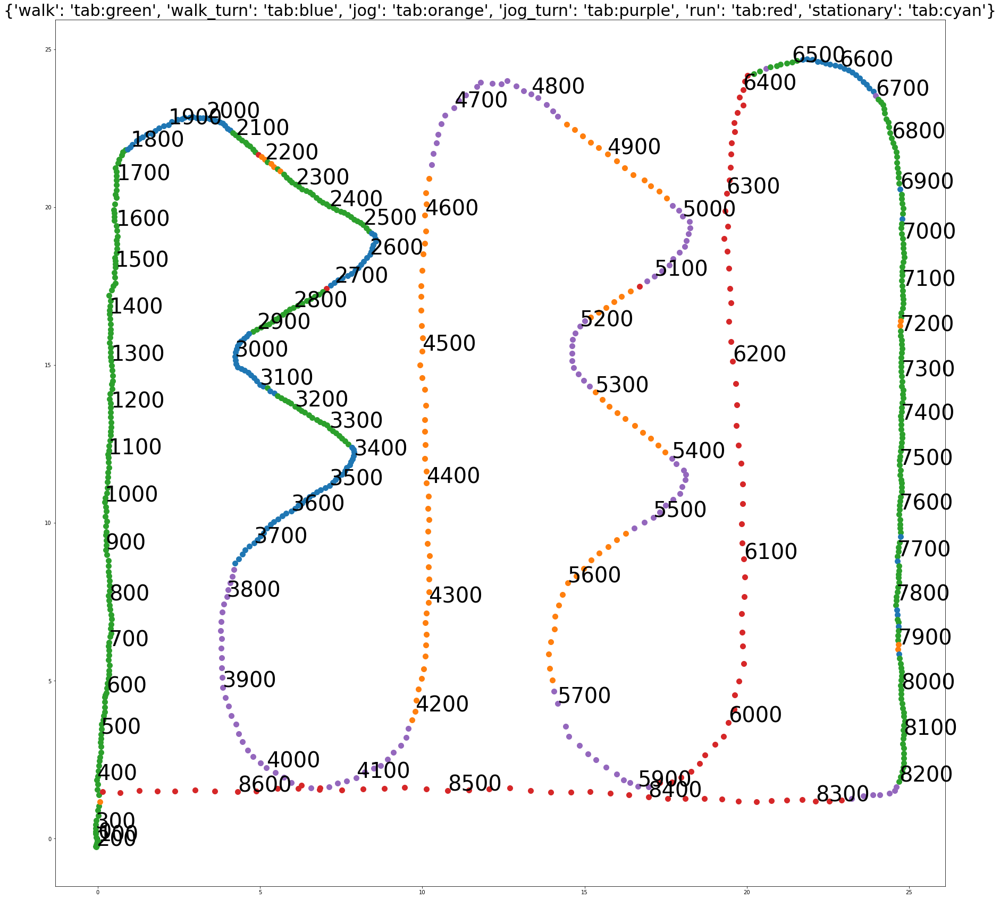

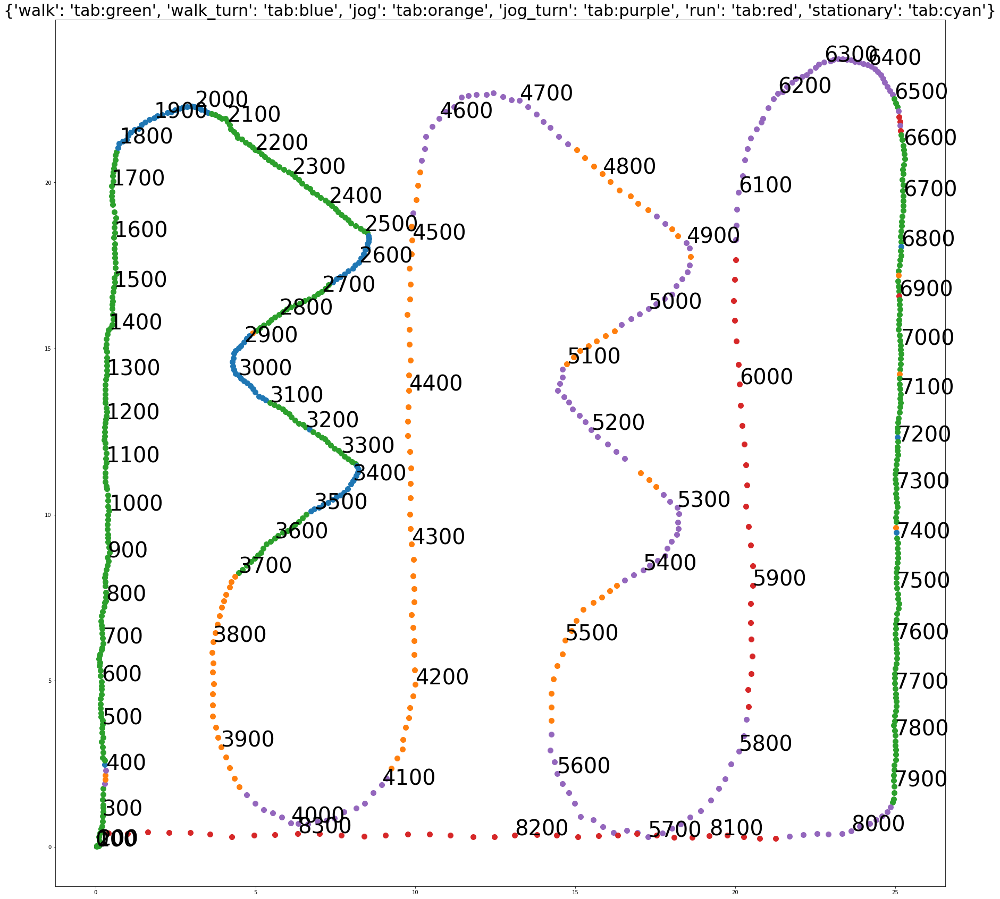

...

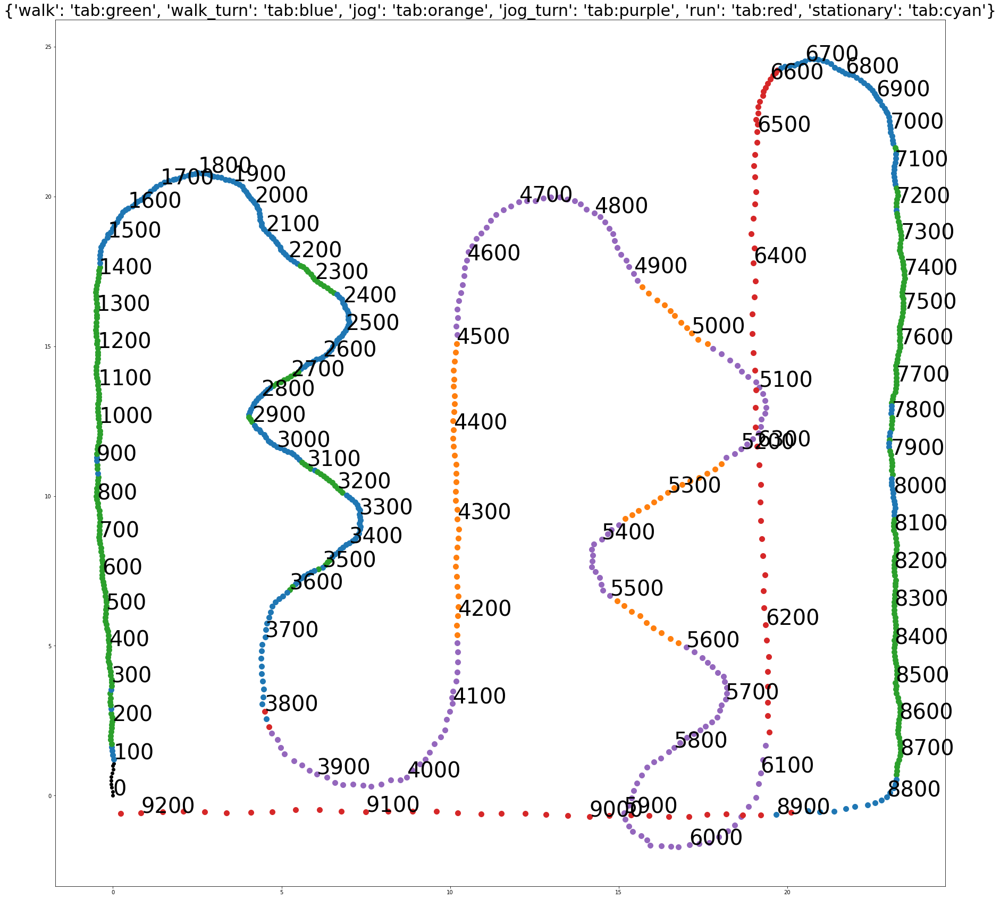

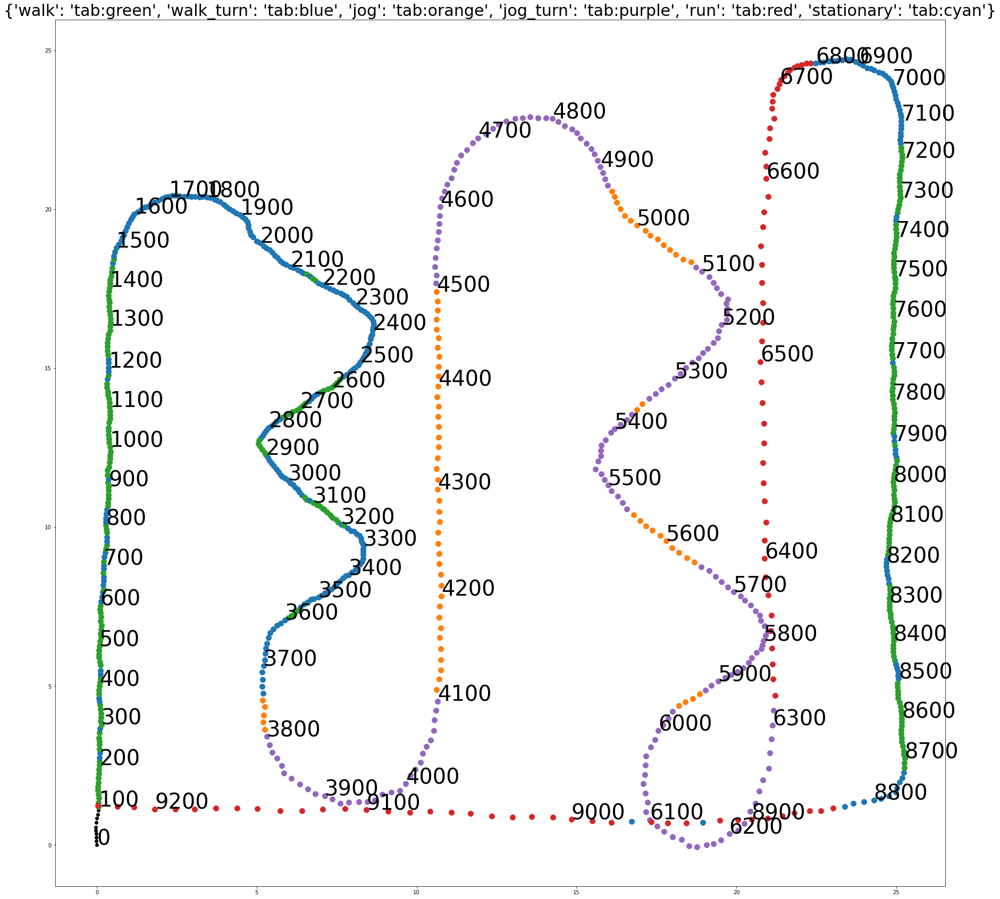

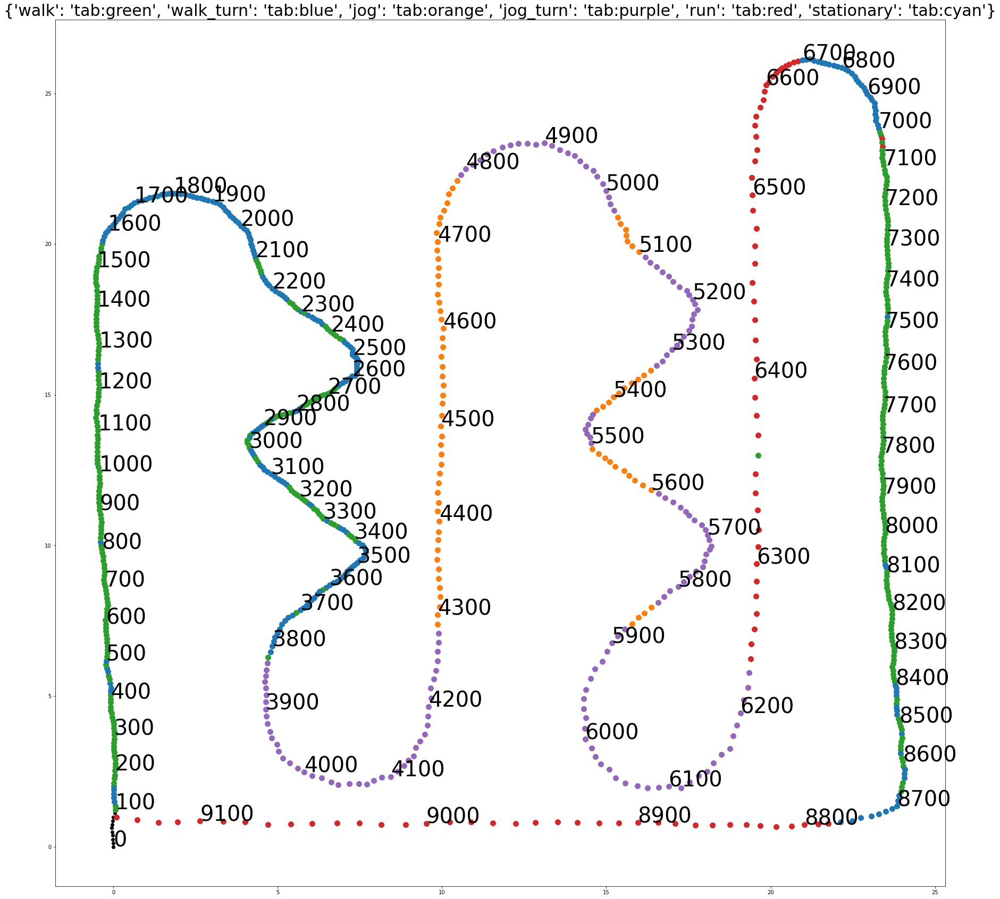

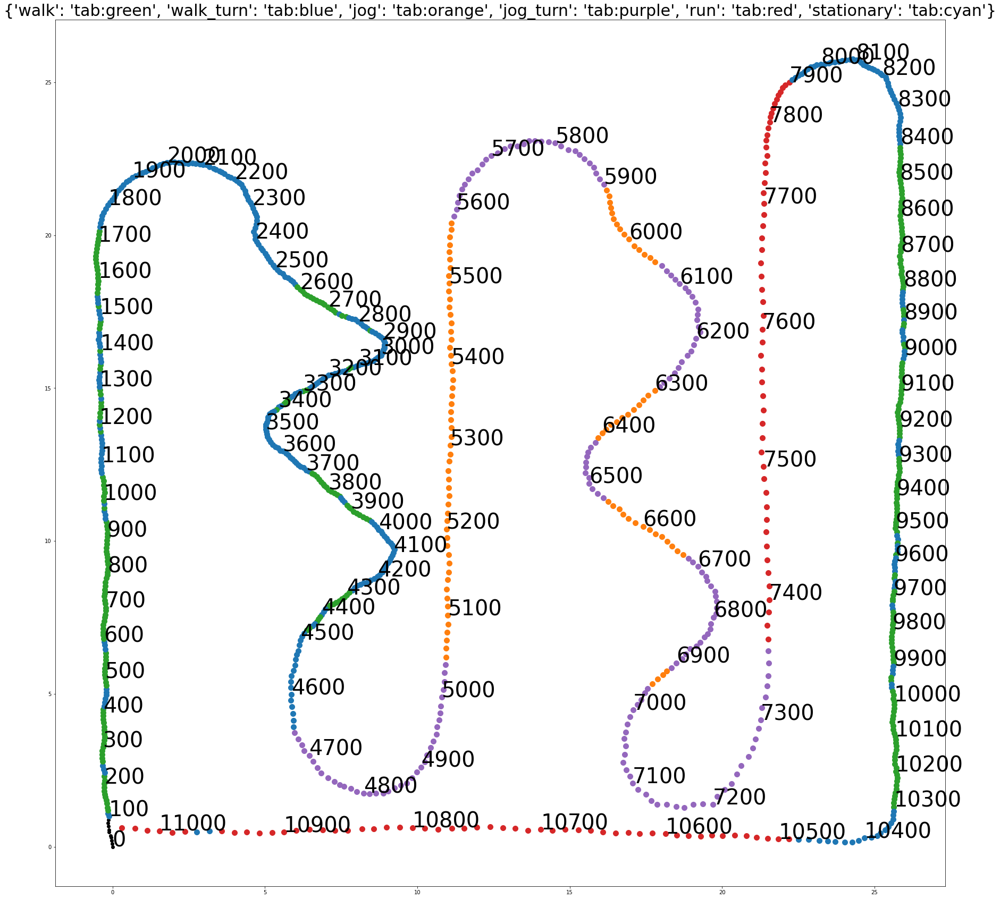

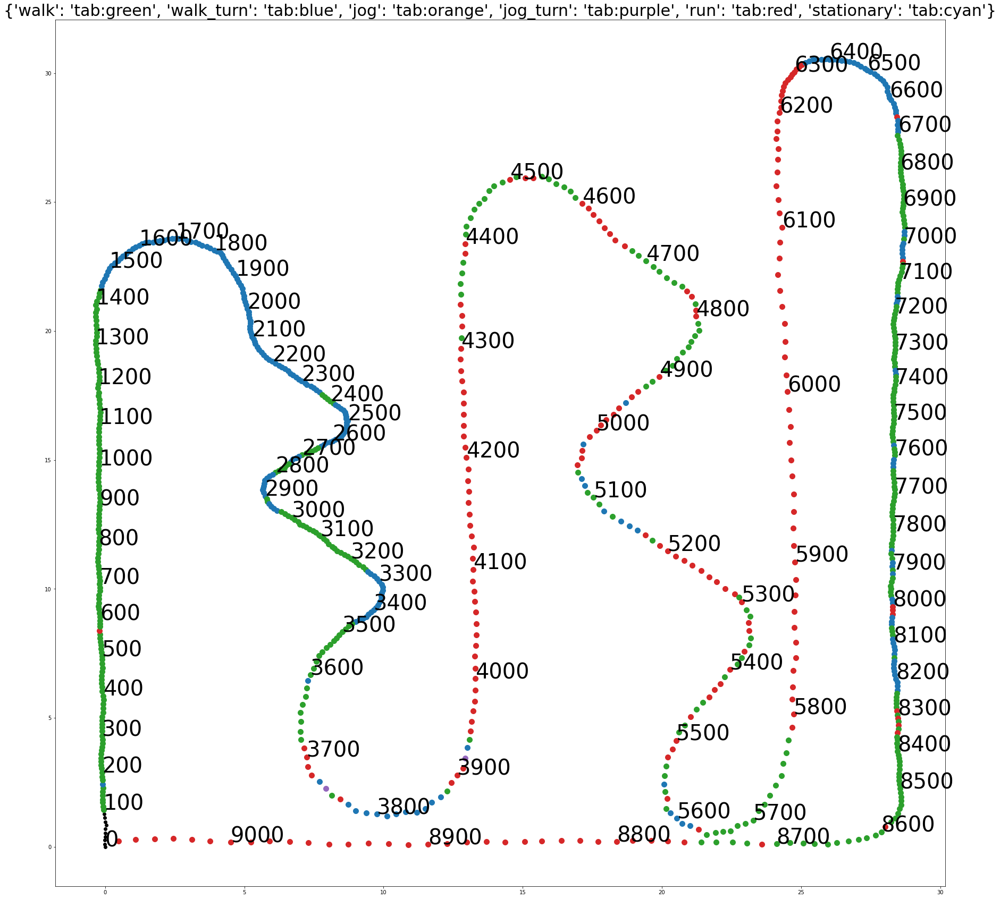

In [37]:
dir_data = Path('./data/datasets_fin/circuit/')
np.set_printoptions(precision=3)
SR = {  
    LABEL['walk']: [1,100],
    LABEL['walk_turn']: [1,100],
    LABEL['jog']: [2,100],
    LABEL['jog_turn']: [4,100],
    LABEL['run']: [10,100],
    LABEL['stationary']: [1,100],
}

files = []
filenames = []
for file in dir_data.glob("*circuit*.csv"):
    if("har" in str(file)):
        files.append(file)
files = sorted(files)

dfs = []
for file in files:
    df = pd.read_csv(file)
    dfs.append(df)

angle = np.array([50,50,50,50,50,-40,-40,-40,-40,-40,-40, -40])

angle = angle * np.pi / 180.0

#dfs[0] = dfs[0][:]
#dfs[4] = dfs[4][:]
#dfs[6] = dfs[6][:]
dfs[2] = dfs[2][:8200]
color = {'walk': 'tab:green',
         'walk_turn': 'tab:blue',
         'jog': 'tab:orange',
         'jog_turn': 'tab:purple',
         'run': 'tab:red',
         'stationary': 'tab:cyan',
        }
for j, df_org in enumerate(dfs):
    
    enux = df_org['enu_x'].to_numpy()
    enuy = df_org['enu_y'].to_numpy()
    
    x = np.cos(angle[j])*enux - np.sin(angle[j])*enuy
    y = np.sin(angle[j])*enux + np.cos(angle[j])*enuy
    
    df_org['enu_x'] = x
    df_org['enu_y'] = y
    
    end_drop = df_org.loc[(df_org['enu_x']<df_org['enu_x'].iloc[0]) & (df_org['time'] > df_org.iloc[-200*10]['time'])].index
    df_org.drop(inplace=True, index=end_drop)
    start_drop = df_org.loc[(df_org['enu_y']<df_org['enu_y'].iloc[-1]) & (df_org['time'] < df_org.iloc[200*10]['time'])].index
    df_org.drop(inplace=True, index=start_drop)
    
    df_org.reset_index(drop=True, inplace=True)
    
    df_org['enu_x'] -= df_org.loc[0,'enu_x']
    df_org['enu_y'] -= df_org.loc[0,'enu_y']
    
   # plt.figure(j)
   # show_gps_label(df_org.dropna(subset=['enu_x']), enu_format=1, annotate=1)
   # plt.show()
    print()
    print()
    print()

# Proposed method

In [43]:
def build_signal_image(df_org, sr_imu=100):
    cols = list(df_org.columns)
    raw_signal = df_org[:n_sample][['gyrX', 'gyrY', 'gyrZ', 'eulR', 'eulP', 'eulY']].to_numpy().copy().T
    raw_signal[[0,1,2]] *= 180/np.pi
    signal_index_sequence = [1, 2, 3, 4, 5, 6, 1, 3, 
                             5, 1, 4, 6, 2, 4, 5, 2]
    signal_image = np.array([raw_signal[idx-1] for idx in signal_index_sequence], dtype=float)
    signal_image = np.reshape(signal_image, (1, 16, n_sample))
    
    return signal_image

def har_predict(images, sr_imu):
    images = np.array(images)
    with torch.no_grad():
        if(sr_imu != n_sample):
            images = downsample_imu(images, n_sample, sr_imu)
            images = interpolate_imu(images, sr_imu, n_sample)
        images = torch.Tensor(images)
        images.requires_grad = False
        net.eval()
        res = net(images)
        predictions = np.argmax(res.cpu().detach().numpy(), axis=-1)
    return predictions


def downsample_imu(images, from_f, to_f):
    interval = int(from_f/to_f)
    assert interval == float(from_f)/to_f, "The sampling rate ratio must be a integer"
    return images[:,:,:,::interval]


def interpolate_imu(a, from_f, to_f):
    interval = int(to_f/from_f)
    assert interval == float(to_f)/from_f, "The sampling rate ratio must be a integer"
    arr = np.zeros([a.shape[0], a.shape[1], a.shape[2], a.shape[3]*interval], dtype=a.dtype)
    arr[:,:,:,::interval] = a
    inc = np.zeros(a.shape)
    inc[:,:,:,:-1] = (a[:,:,:,1:] - a[:,:,:,:-1])/interval
    inc[:,:,:,-1] = inc[:,:,:,-2]
    for i in range(1,interval):
        arr[:,:,:,i::interval] = arr[:,:,:,::interval] + inc*i
    return arr

def downsample(gnss_base, pred):
    n_samples = 100
    gnss_downsample = np.array(gnss_base).copy()
    
    gnss_cols = ['time','enu_x','enu_y','speed']
    
    f = lambda x: 10/SR[x][0]
    sample_interval = np.fromiter([f(x) for x in pred], dtype=float)
    
    for i, sample in enumerate(gnss_downsample):
        sample_points = np.floor(np.arange(10)*sample_interval[i]+0.5)
        sample_points = np.append(sample_points[sample_points<10], 10)
        drop_points = [x for x in np.arange(10) if x not in sample_points]
        sample[:, drop_points] = np.nan
    return gnss_downsample


def interpolate(gnss_downsample):
    gnss_interpolate = gnss_downsample[:,:,:-1].copy()
    gnss_cols = ['time','enu_x','enu_y','speed']
    for i, sample in enumerate(gnss_downsample):
        df = pd.DataFrame(sample.T, columns=gnss_cols)
        df = df.interpolate(method='polynomial', order=1, limit_direction='both')[:-1] # remove 11'th entry
        gnss_interpolate[i] = df.to_numpy().T
    return gnss_interpolate


def calc_error(gnss_true, gnss_interpolate):
    cols = ['time','enu_x','enu_y','speed']
    
    x_org = gnss_true[cols.index('enu_x')]
    y_org = gnss_true[cols.index('enu_y')]
    x_est = gnss_interpolate[cols.index('enu_x')]
    y_est = gnss_interpolate[cols.index('enu_y')]
    
    dist_org = np.sqrt(np.square(x_org[1:]-x_org[:-1])+np.square(y_org[1:]-y_org[:-1]))
    dist_est = np.sqrt(np.square(x_est[1:]-x_est[:-1])+np.square(y_est[1:]-y_est[:-1]))
    
    dRMSE = np.sqrt(np.mean(np.square(dist_org-dist_est)))
    pRMSE = np.sqrt(np.mean(np.square(x_org-x_est)+np.square(y_org-y_est)))
    vRMSE = np.sqrt(np.mean(np.square(gnss_true[cols.index('speed')]-gnss_interpolate[cols.index('speed')])))
    #dRMSE = np.mean(np.abs(dist_org - dist_est))
    #pRMSE = np.mean(np.sqrt(np.square(x_org-x_est)+np.square(y_org-y_est)))
    #vRMSE = np.mean(np.abs(gnss_true[cols.index('speed')]-gnss_interpolate[cols.index('speed')]))
    
    return dRMSE, pRMSE, vRMSE


def calc_power(predictions):
    energy_consumption = {key: 0 for key in LABEL}
    motion_count = {key: 0 for key in LABEL}
    
    for label in LABEL.keys():
        motion_count[label] = (predictions == LABEL[label]).sum()
        
    for label in LABEL:
        energy_consumption[label] = motion_count[label] * PW_GNSS[SR[LABEL[label]][0]] * 0.1 * 0.001# Joule per second
        energy_consumption[label] += motion_count[label] * PW_IMU[SR[LABEL[label]][1]] * 0.1 * 0.001
        
    return np.mean(list(energy_consumption.values()))


POWER = np.zeros(len(dfs))
POWER_GNSS = np.zeros(len(dfs))
POWER_IMU = np.zeros(len(dfs))
vRMSE = np.zeros(len(dfs))
pRMSE = np.zeros(len(dfs))
dRMSE = np.zeros(len(dfs))
motion_count = []
dfs_estimate = []
for df_num in range(len(dfs)):
    motion_count.append({key: 0 for key in LABEL})
    df = dfs[df_num].copy()
    gnss_idx = df.dropna(subset=['enu_x']).index
    
    df['prediction'] = np.ones(len(df)) * np.nan

    for i in range(10,len(gnss_idx)-1):
        div = df.loc[gnss_idx[i-10]:gnss_idx[i+1]-1]
        gnss = div[div['enu_x'].notna()][['time','enu_x','enu_y','speed']]

        if(i==10):
            sr_imu=100
        else:
            sr_imu=SR[LABEL[motion_prev]][1]
            
        signal_image = build_signal_image(div, sr_imu)
        signal_image = signal_image[np.newaxis, ...].reshape(-1,1,16,100)
        motion = dfs[df_num].loc[gnss_idx[i],'prediction']
        #motion = har_predict(signal_image, sr_imu)[0]

        gnss_downsample = downsample([gnss.to_numpy().copy().T], np.array([motion]))
        gnss_interpolate = interpolate(np.array(gnss_downsample))

        new_gnss = pd.DataFrame(gnss_interpolate[0].T, index=gnss.index[:-1], columns=['time','enu_x','enu_y','speed'])
        df.loc[gnss.index[:-1],['time','enu_x','enu_y','speed']] = new_gnss
        df.loc[gnss.index[:-1],['prediction']] = motion

        motion_count[df_num][get_key(motion, LABEL)] += 1
        motion_prev = get_key(motion, LABEL)

    df_true = dfs[df_num]
    #print(df_true[df_true['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T)
    #print(df[df['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T)

    dRMSE[df_num], pRMSE[df_num], vRMSE[df_num] = calc_error(
            df_true[df_true['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T,
            df[df['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T
    )
    dfs_estimate.append(df.copy())

    for label in LABEL.keys():
        [sr_gnss, sr_imu] = SR[LABEL[label]]
        POWER_GNSS[df_num] += motion_count[df_num][label] * 0.1*PW_GNSS[sr_gnss]
        POWER_IMU[df_num]  += motion_count[df_num][label] * 0.1*PW_IMU[sr_imu]
        POWER[df_num] += motion_count[df_num][label] * 0.1*(PW_GNSS[sr_gnss]+PW_IMU[sr_imu])

    duration = np.sum(list(motion_count[df_num].values()))*0.1
    #print(duration)
    POWER[df_num] /= duration
    POWER_GNSS[df_num] /= duration
    POWER_IMU[df_num] /= duration

   # print(f"{pRMSE[df_num]:.3f},{vRMSE[df_num]:.3f},{dRMSE[df_num]:.3f},{POWER[df_num]:.3f}, {POWER_GNSS[df_num]:.3f}, {POWER_IMU[df_num]:.3f}")
print()
print(f"{np.mean(pRMSE[df_num]):.3f},{np.mean(vRMSE[df_num]):.3f},{np.mean(dRMSE[df_num]):.3f},{np.mean(POWER[df_num]):.3f}, {np.mean(POWER_GNSS[df_num]):.3f}, {np.mean(POWER_IMU[df_num]):.3f}")



0.407,0.172,0.041,29.374, 17.374, 12.000


{'walk': 4352,
 'walk_turn': 2495,
 'jog': 1091,
 'jog_turn': 1663,
 'run': 1099,
 'stationary': 0}

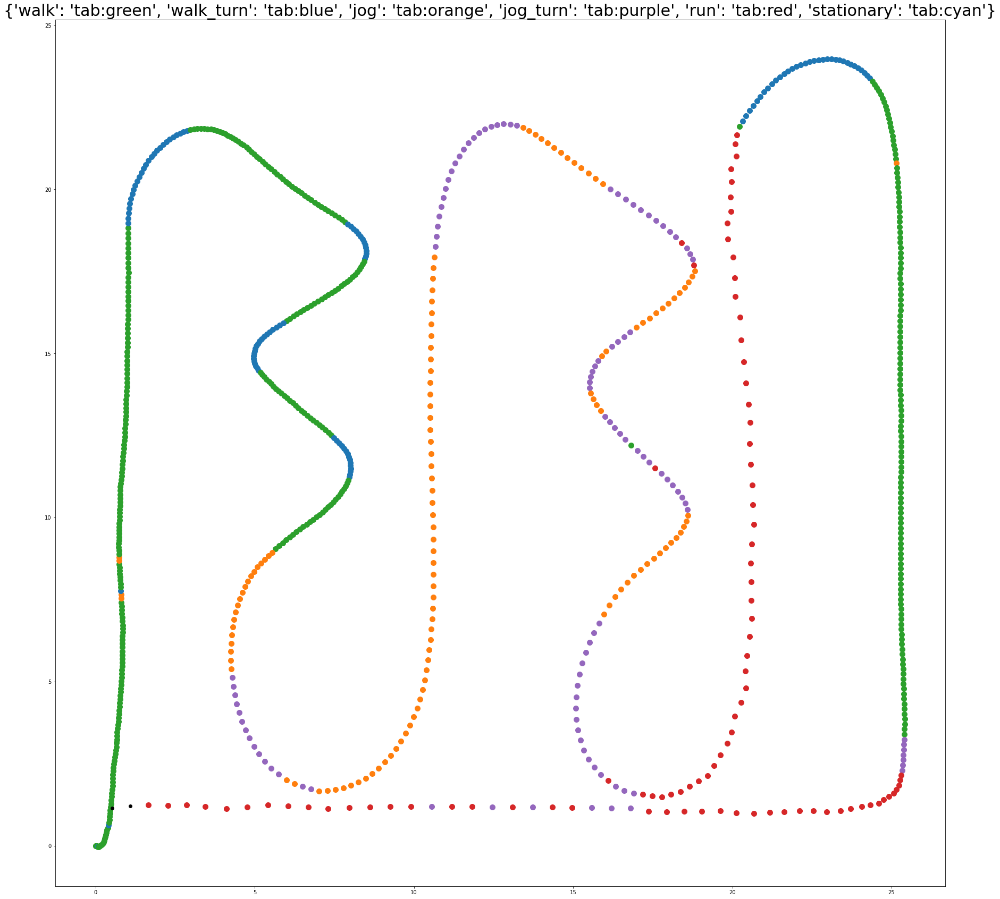

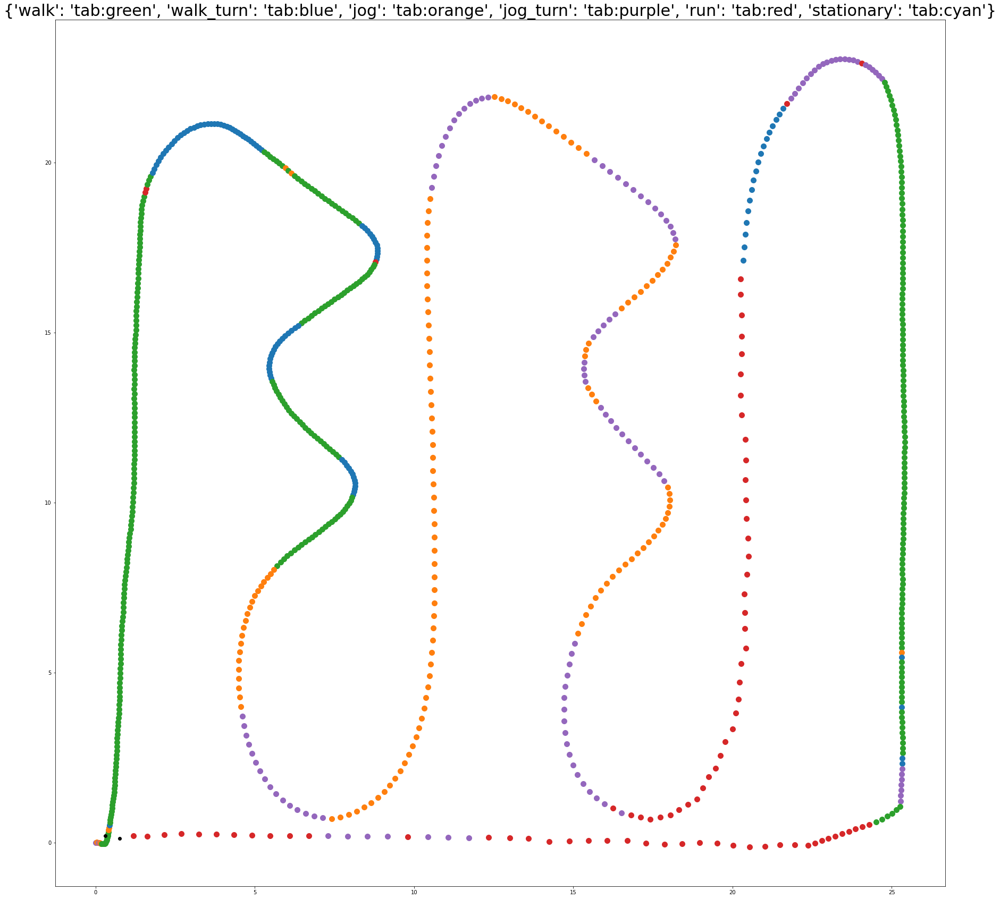

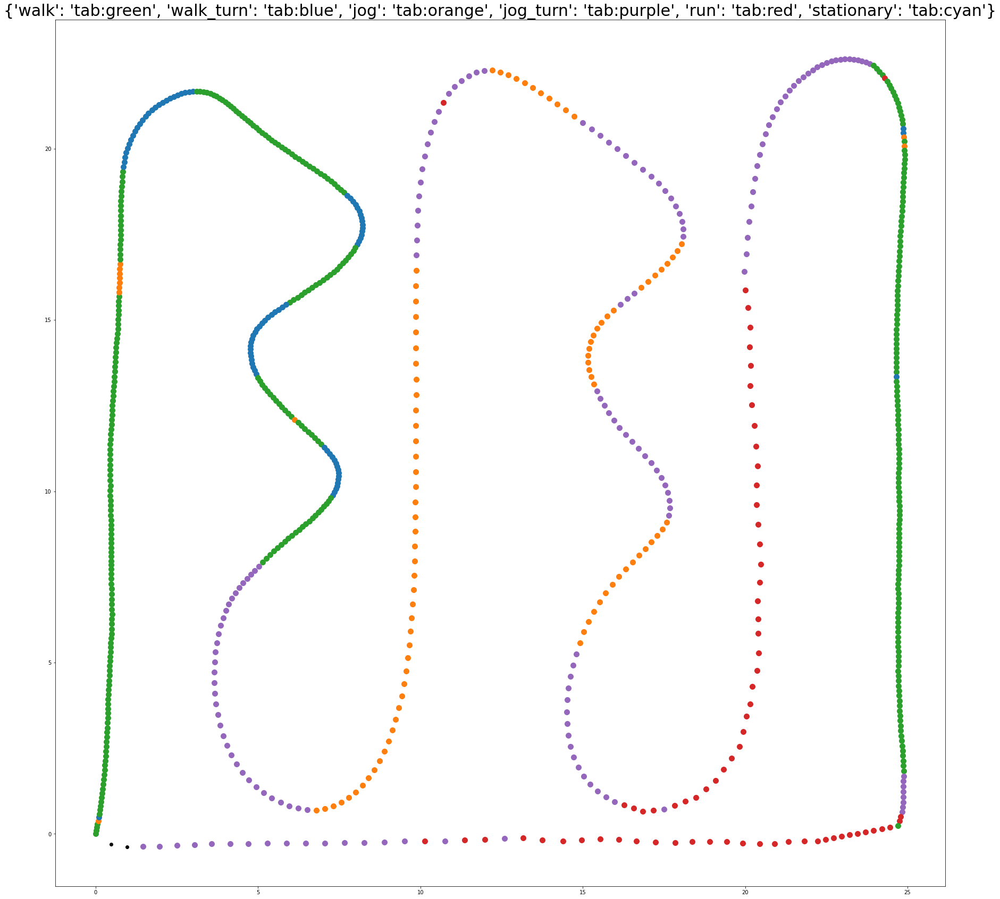

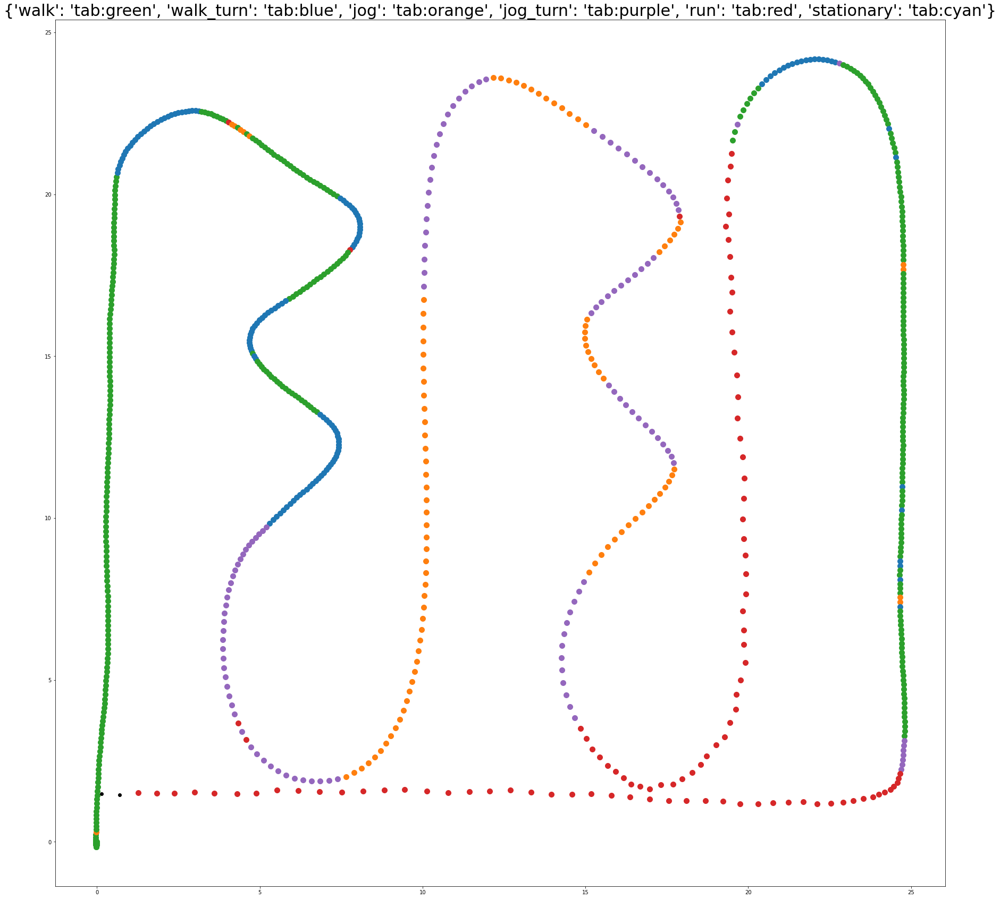

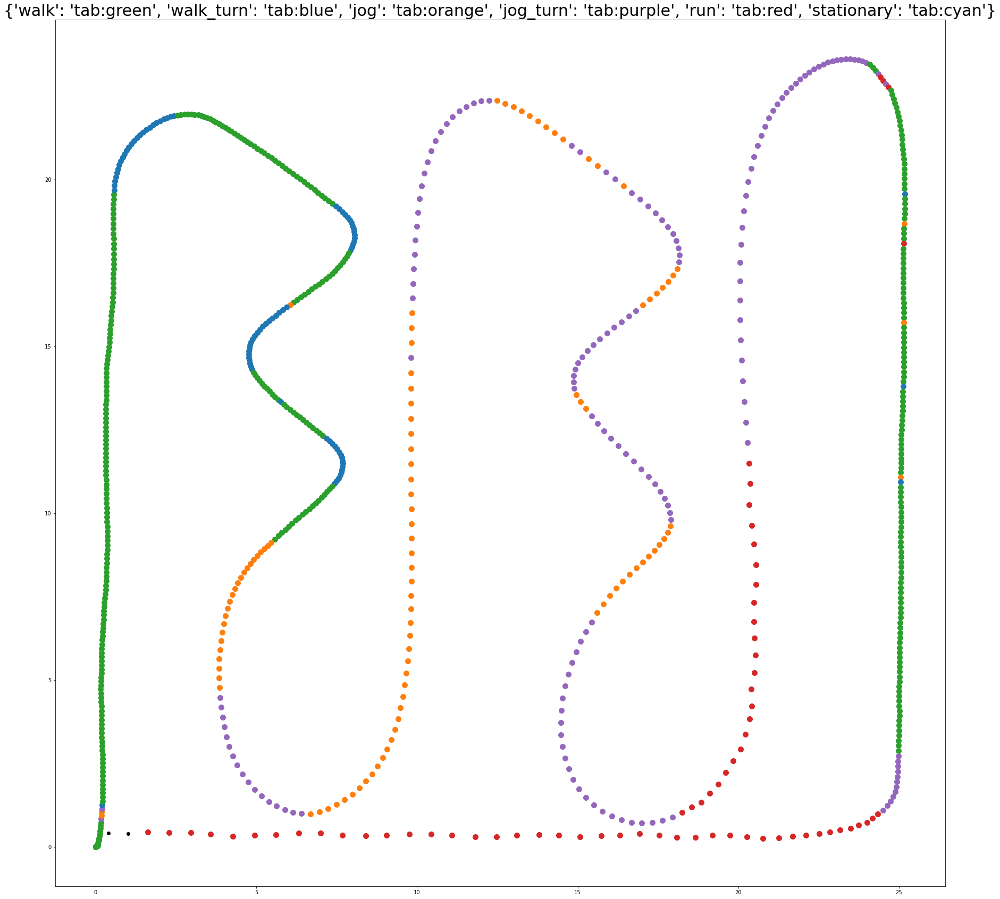

...

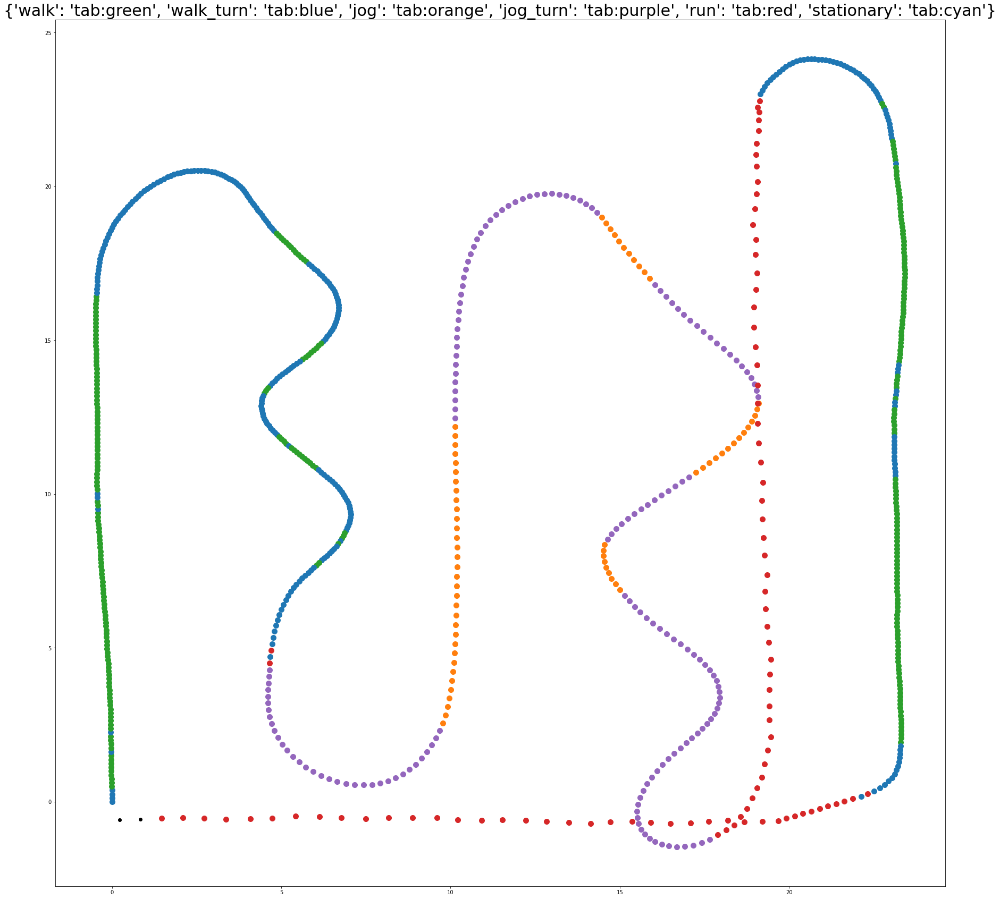

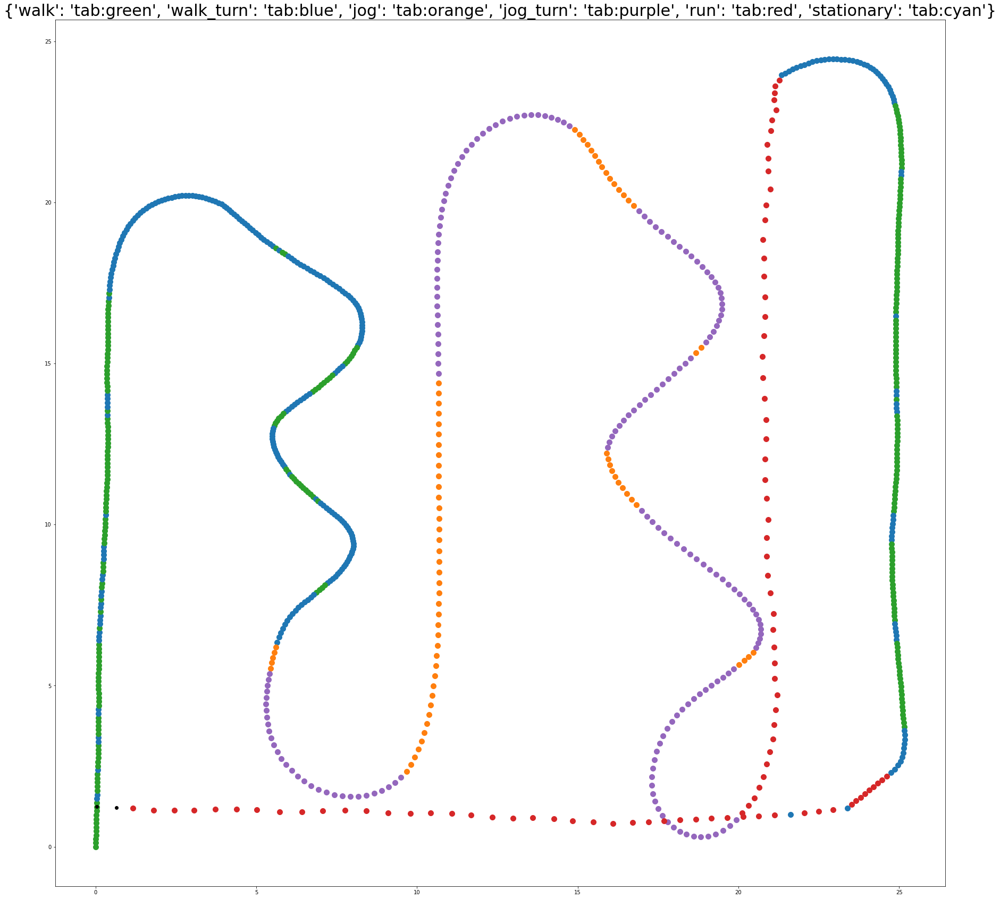

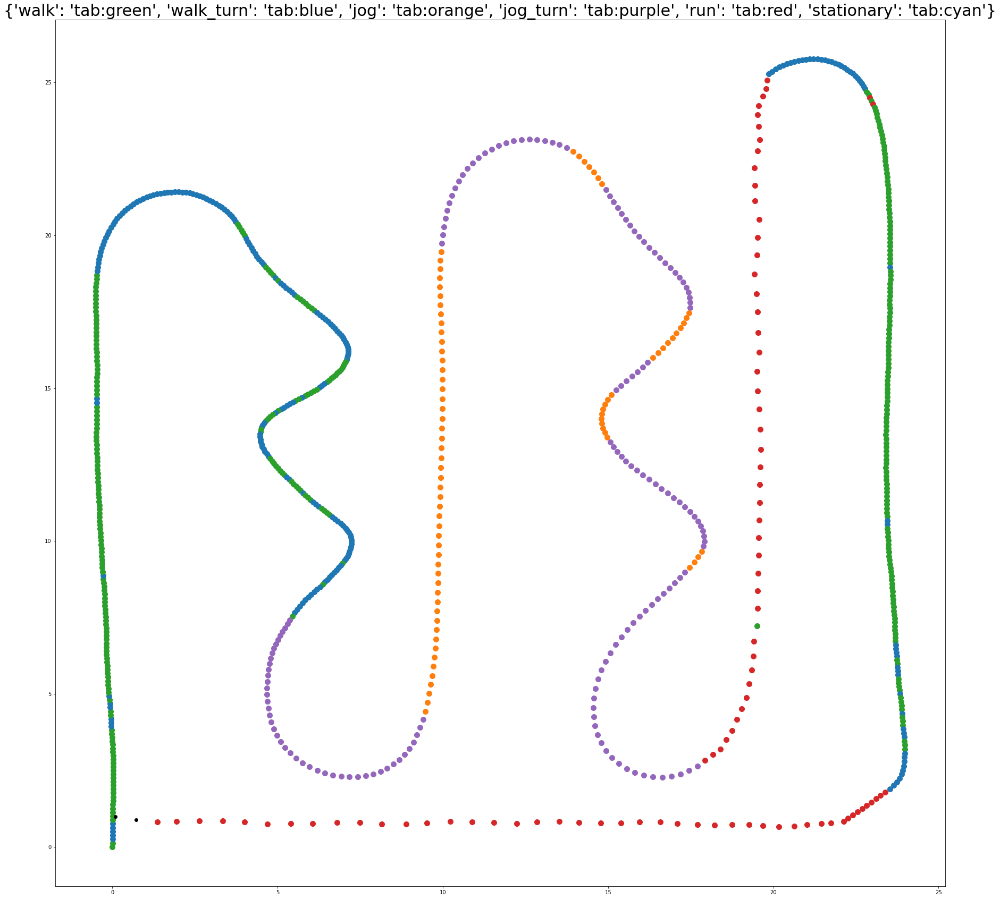

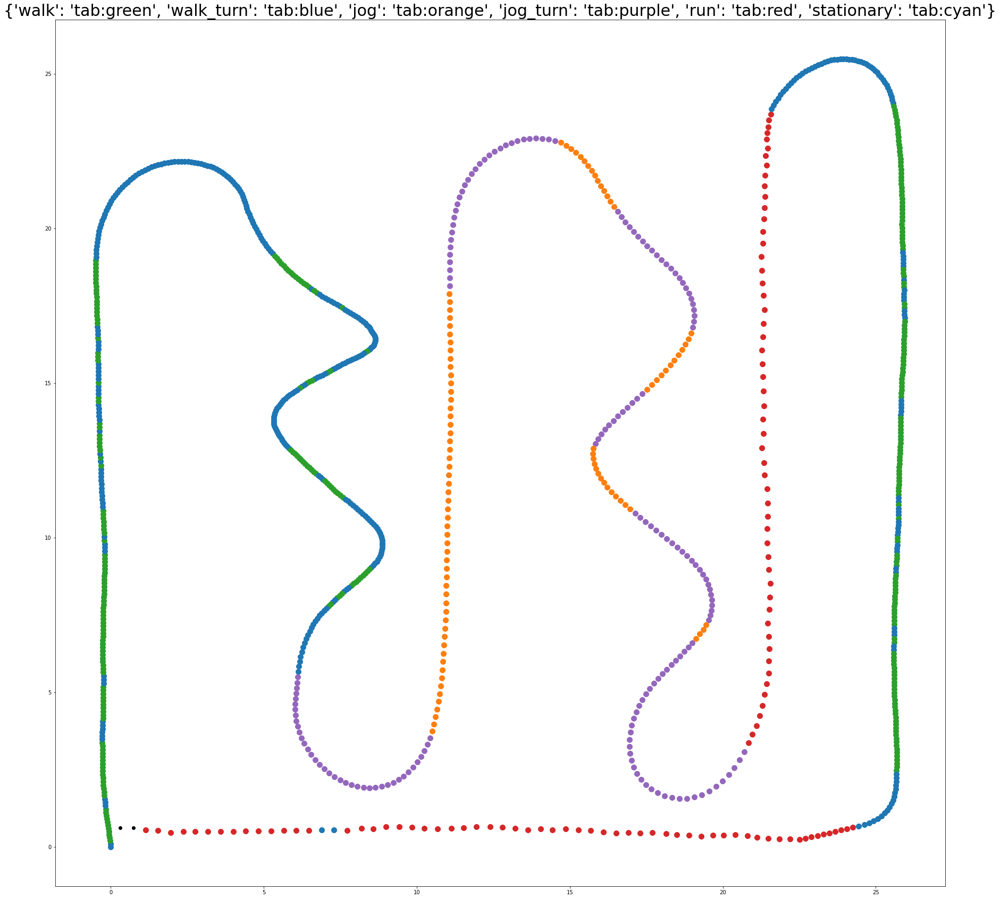

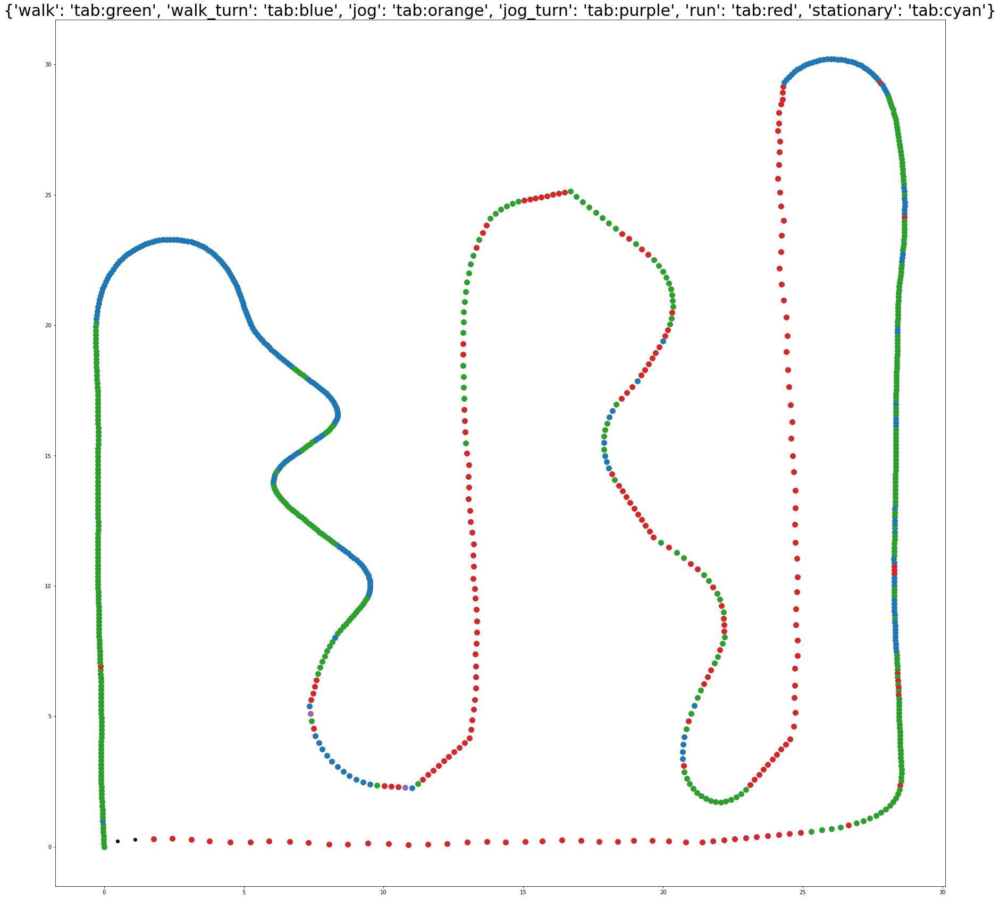

In [39]:
#show_gps(dfs[0].dropna(subset=['enu_x']), enu_format=True)
for i in range(len(dfs_estimate)):
    plt.figure(i)
    show_gps_label(dfs_estimate[i].dropna(subset=['enu_x']), idx_start=0, idx_end=None, enu_format=1, annotate=False)
res = {key:0 for key in LABEL.keys()}
for i in range(len(motion_count)):
    for label in LABEL:
        res[label]+=motion_count[i][label]
        
res

# Fixed threshold

In [45]:

POWER_GNSS = np.zeros(len(dfs))
POWER_IMU = np.zeros(len(dfs))
POWER = np.zeros(len(dfs))
vRMSE = np.zeros(len(dfs))
pRMSE = np.zeros(len(dfs))
dRMSE = np.zeros(len(dfs))
motion_count = []
dfs_estimate = []
for df_num in range(len(dfs)):
    motion_count.append({key: 0 for key in LABEL})
    df = dfs[df_num].copy()
    gnss_idx = df.dropna(subset=['enu_x']).index
    
    df['prediction'] = np.ones(len(df)) * np.nan

    for i in range(10,len(gnss_idx)-1):
        div = df.loc[gnss_idx[i-10]:gnss_idx[i+1]-1]
        gnss = div[div['enu_x'].notna()][['time','enu_x','enu_y','speed']]

        if(i==10):
            sr_imu=100
        else:
            sr_imu=SR[LABEL[motion_prev]][1]
            #sr_imu=0
        speed = np.mean(gnss['speed'].to_numpy())
        #print(speed)
        if(speed >3.0):
            motion = LABEL['run']
        elif(speed>1.5):
            motion = LABEL['jog']
        elif(speed>0.2):
            motion = LABEL['walk']
        else:
            motion = LABEL['stationary']

        gnss_downsample = downsample([gnss.to_numpy().copy().T], np.array([motion]))
        gnss_interpolate = interpolate(np.array(gnss_downsample))

        new_gnss = pd.DataFrame(gnss_interpolate[0].T, index=gnss.index[:-1], columns=['time','enu_x','enu_y','speed'])
        df.loc[gnss.index[:-1],['time','enu_x','enu_y','speed']] = new_gnss
        df.loc[gnss.index[:-1],['prediction']] = motion

        motion_count[df_num][get_key(motion, LABEL)] += 1
        motion_prev = get_key(motion, LABEL)

    df_true = dfs[df_num]
    #print(df_true[df_true['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T)
    #print(df[df['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T)

    dRMSE[df_num], pRMSE[df_num], vRMSE[df_num] = calc_error(
            df_true[df_true['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T,
            df[df['enu_x'].notna()][['time','enu_x','enu_y','speed']].to_numpy().T
    )
    dfs_estimate.append(df.copy())

    for label in LABEL.keys():
        [sr_gnss, sr_imu] = SR[LABEL[label]]
        POWER_GNSS[df_num] += motion_count[df_num][label] * 0.1*PW_GNSS[sr_gnss]
        POWER_IMU[df_num]  += motion_count[df_num][label] * 0.1*PW_IMU[sr_imu]
        POWER[df_num] += motion_count[df_num][label] * 0.1*(PW_GNSS[sr_gnss]+PW_IMU[sr_imu])

    duration = np.sum(list(motion_count[df_num].values()))*0.1
    #print(duration)
    POWER[df_num] /= duration
    POWER_GNSS[df_num] /= duration
    POWER_IMU[df_num] /= duration
    
#    print(f"{pRMSE[df_num]:.3f},{vRMSE[df_num]:.3f},{dRMSE[df_num]:.3f},{POWER[df_num]:.3f}, {POWER_GNSS[df_num]:.3f}, {POWER_IMU[df_num]:.3f}")

print()
print(f"{np.mean(pRMSE[df_num]):.3f},{np.mean(vRMSE[df_num]):.3f},{np.mean(dRMSE[df_num]):.3f},{np.mean(POWER[df_num]):.3f}, {np.mean(POWER_GNSS[df_num]):.3f}, {np.mean(POWER_IMU[df_num]):.3f}")



0.177,0.123,0.024,33.854, 21.854, 12.000


{'walk': 4352,
 'walk_turn': 2495,
 'jog': 1091,
 'jog_turn': 1663,
 'run': 1099,
 'stationary': 0}

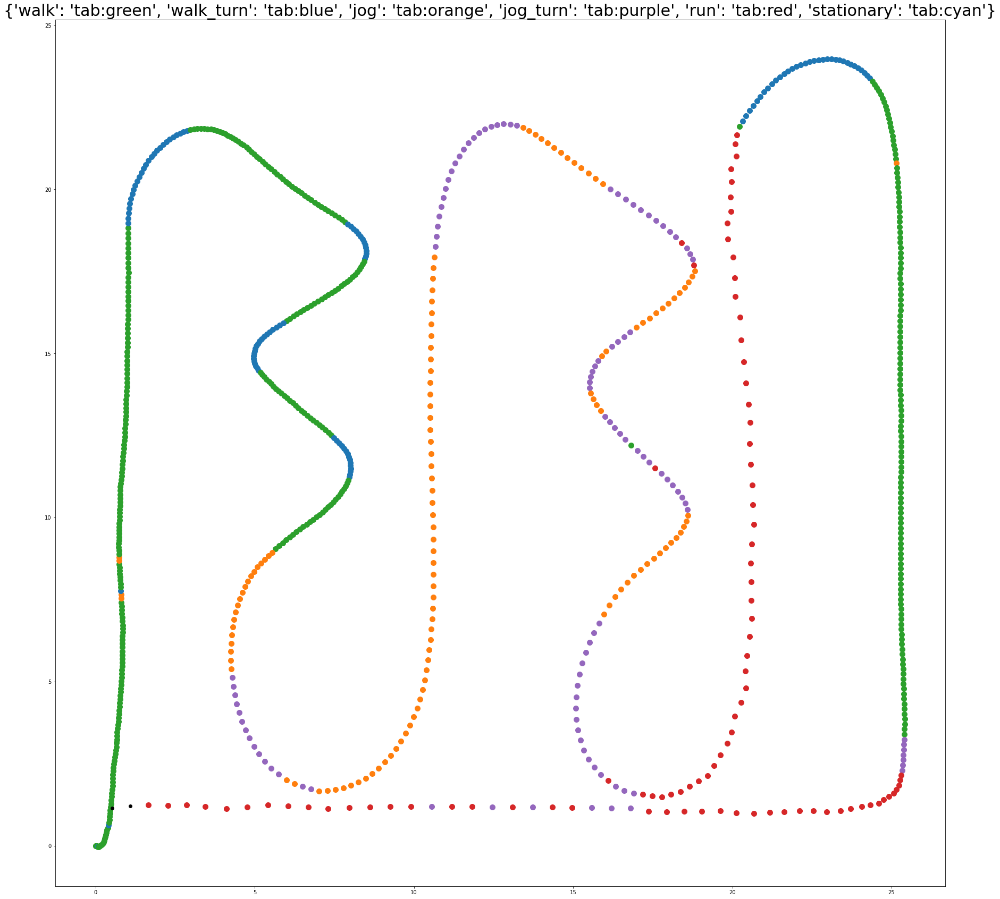

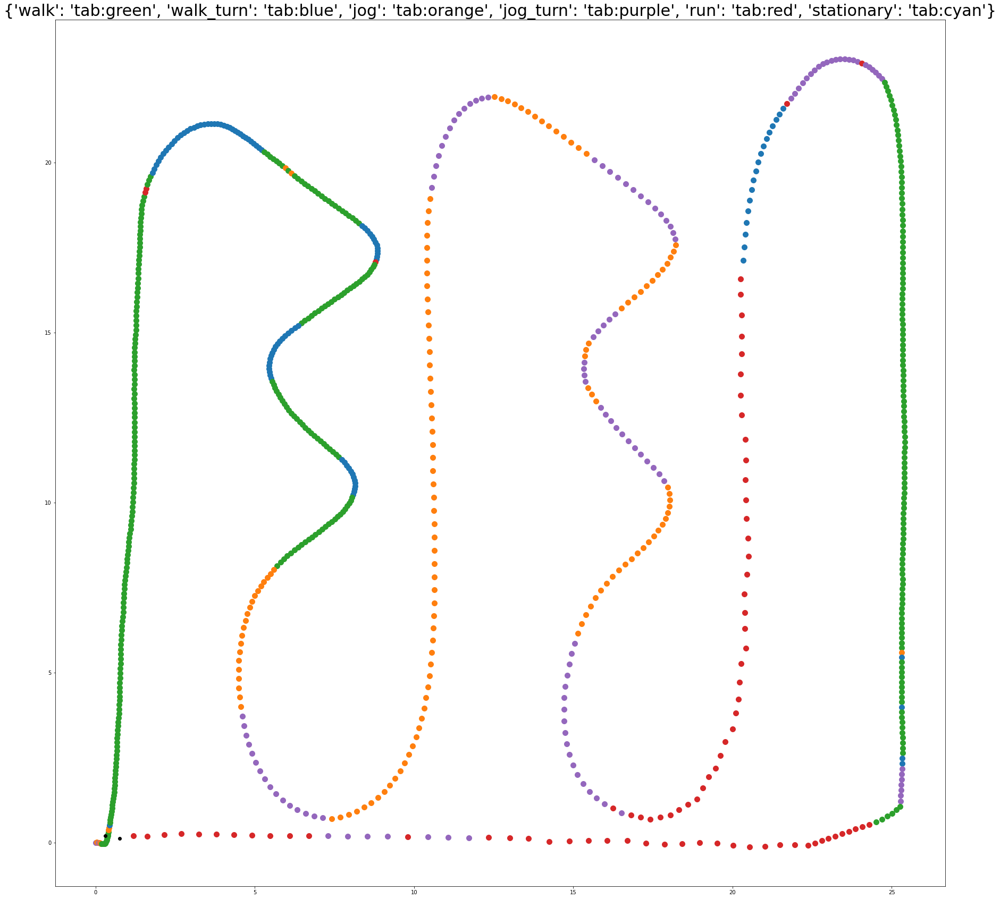

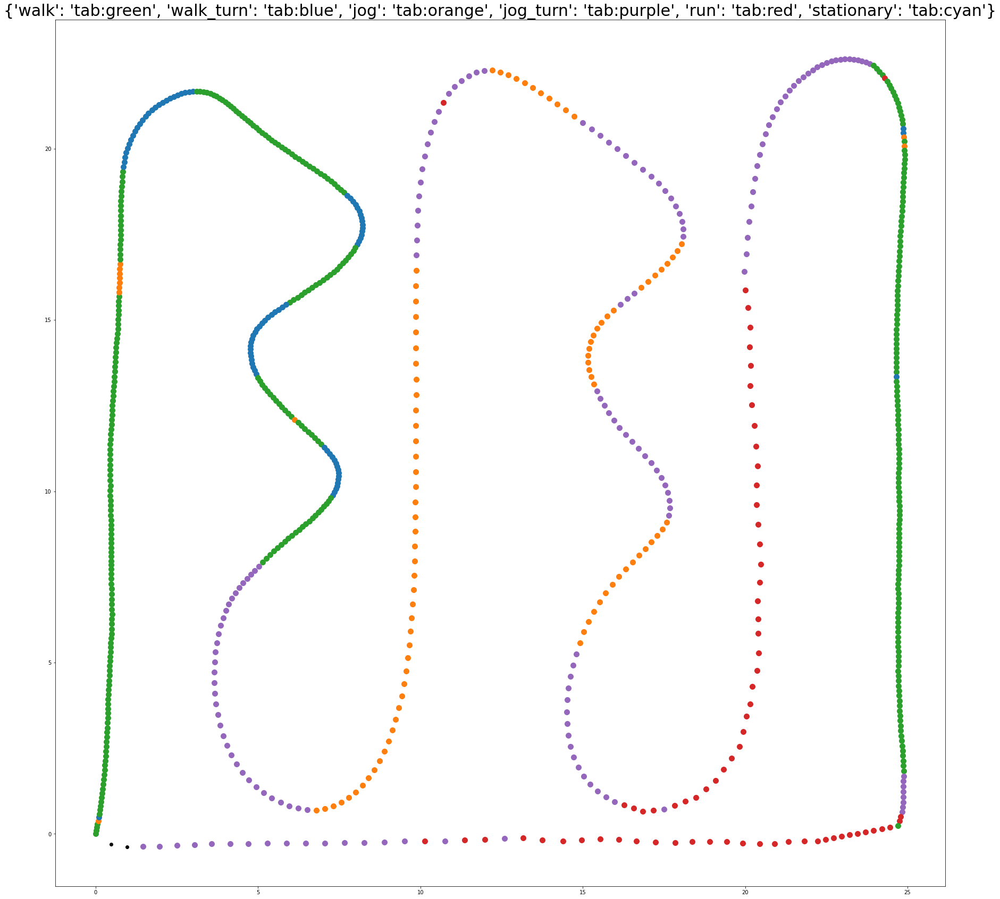

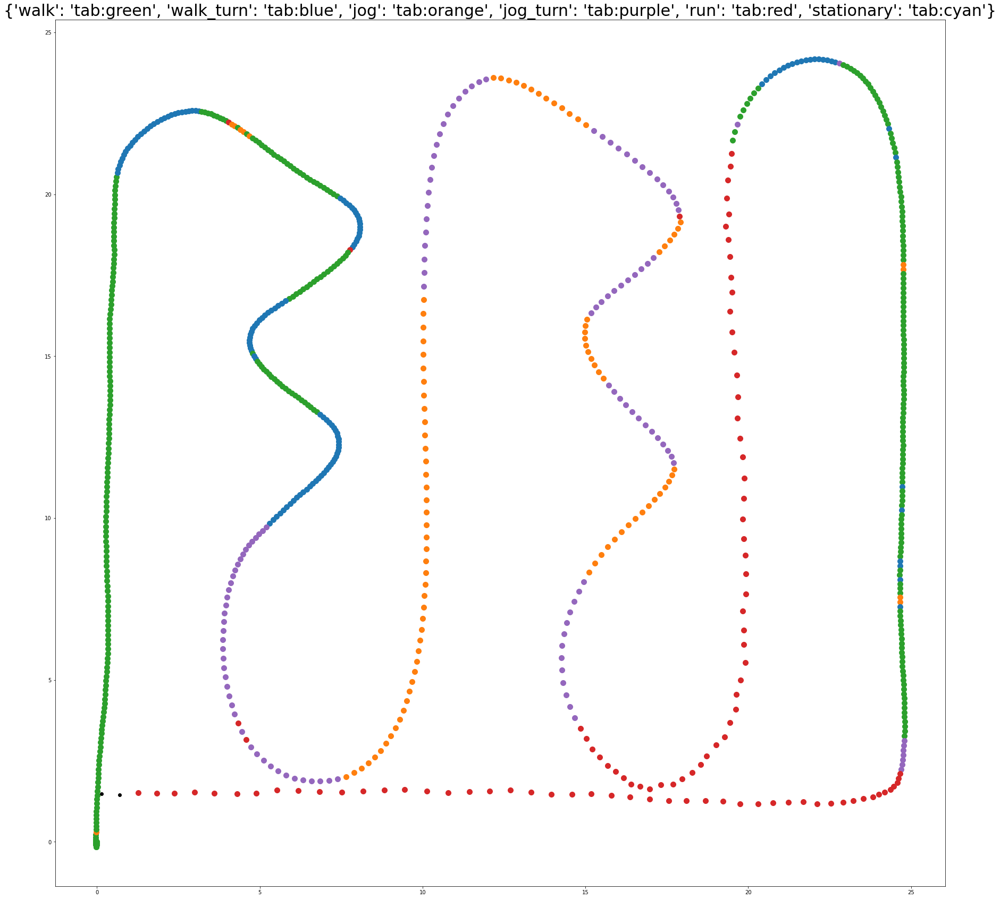

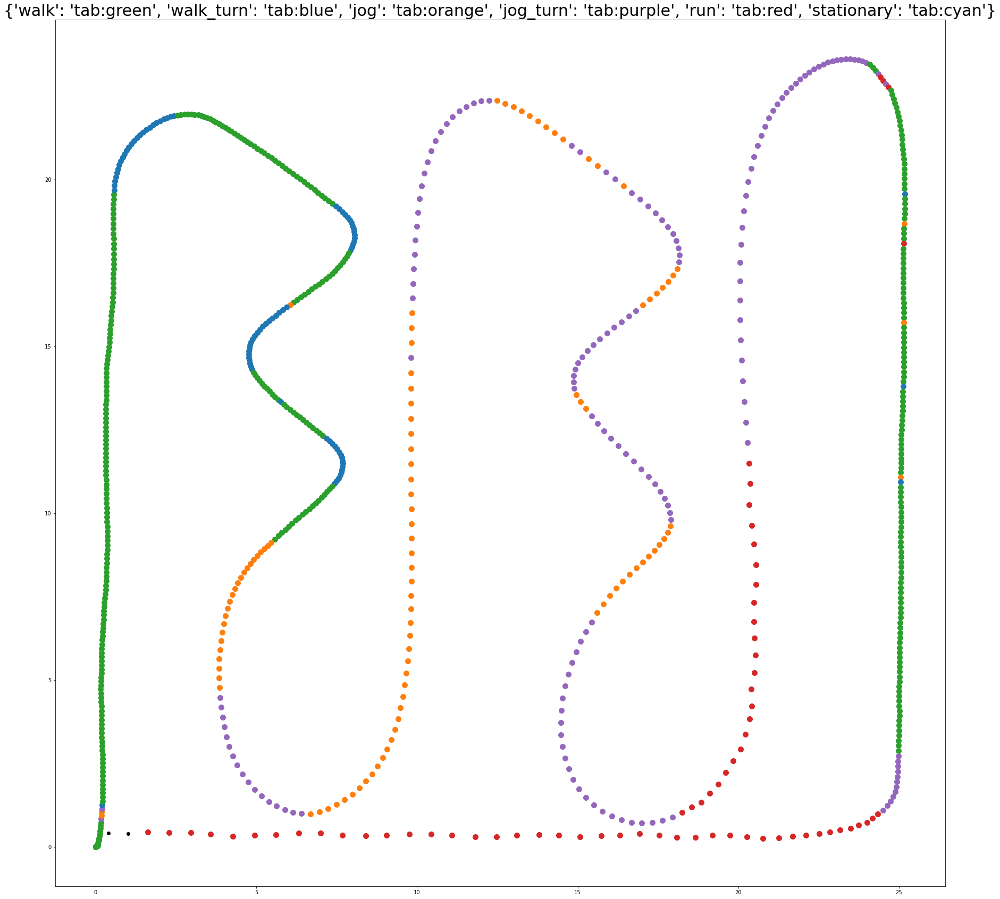

...

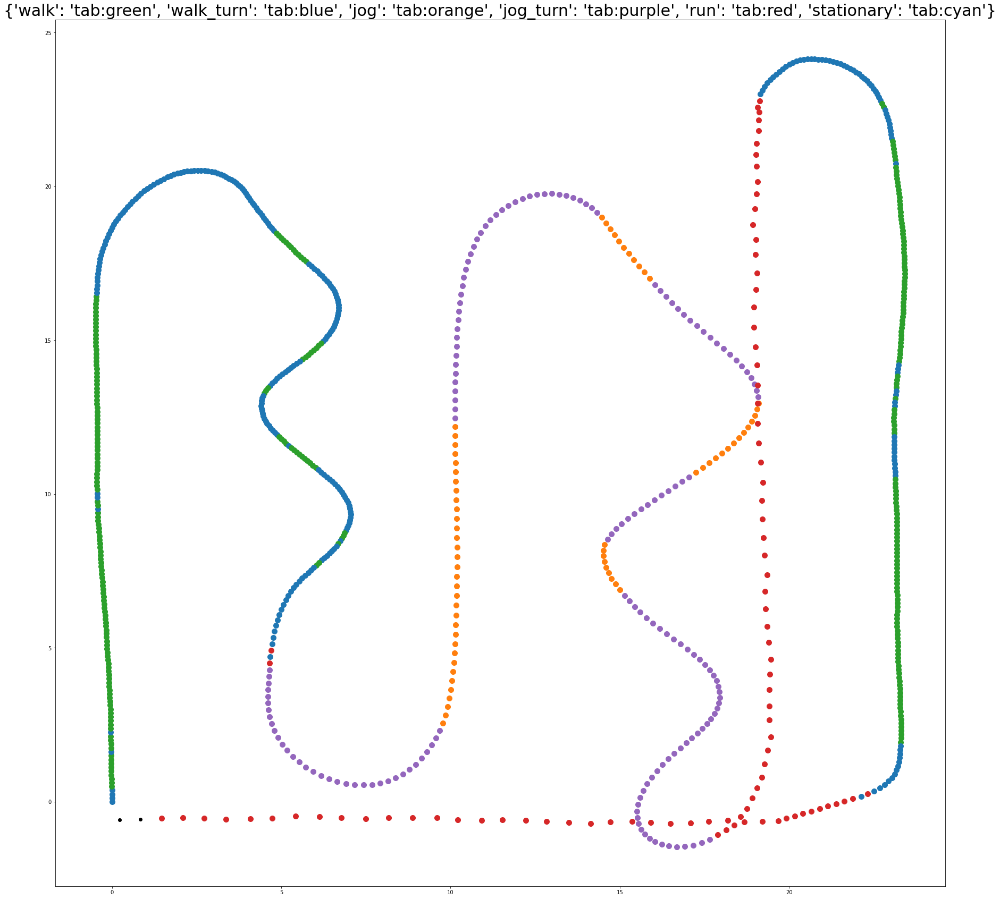

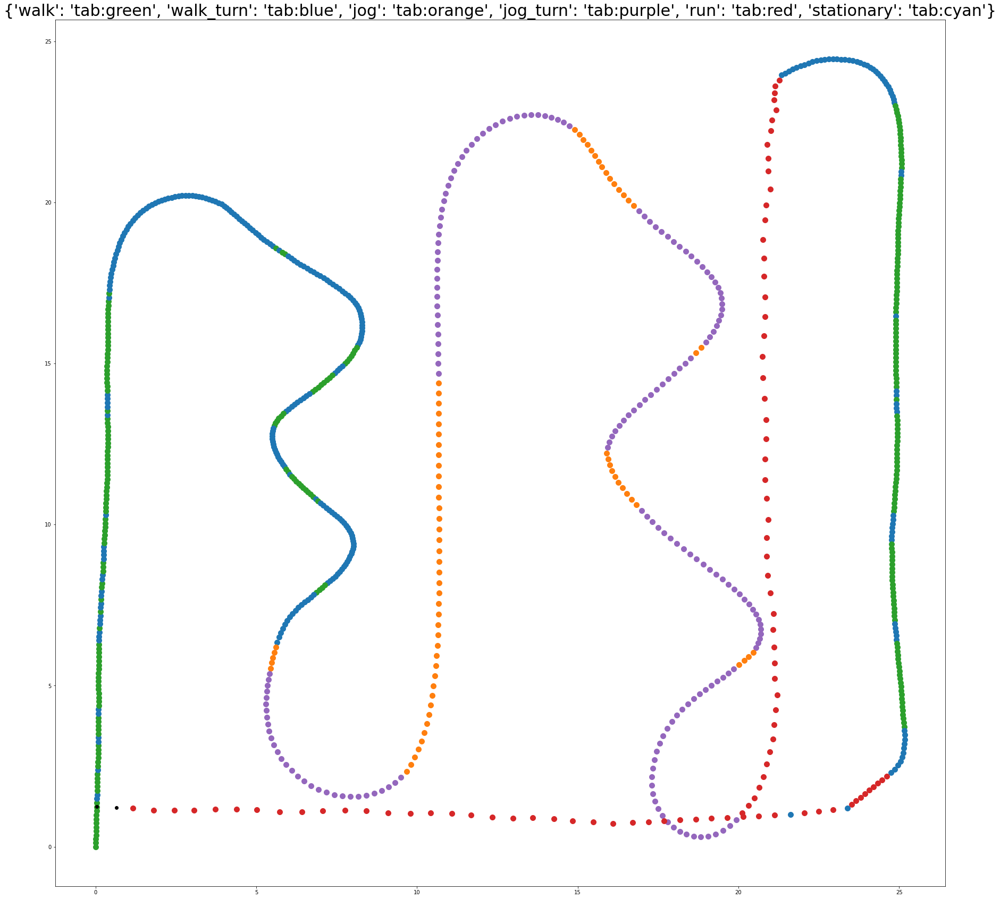

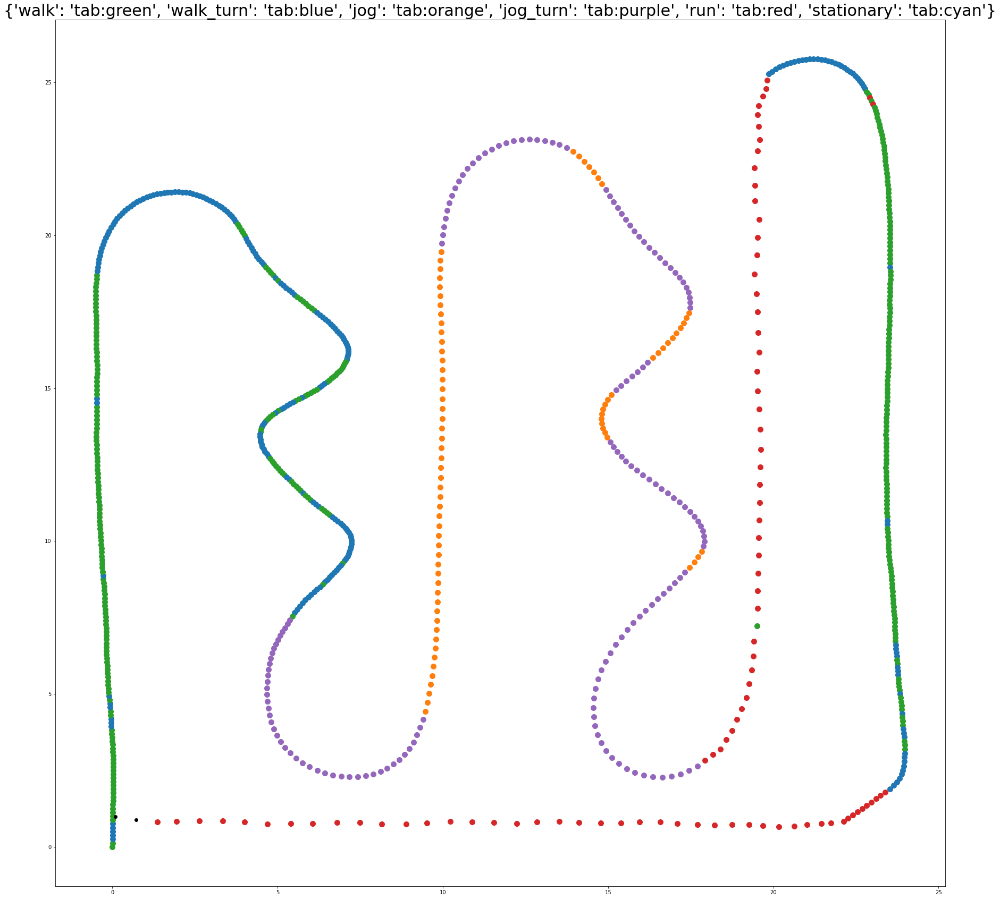

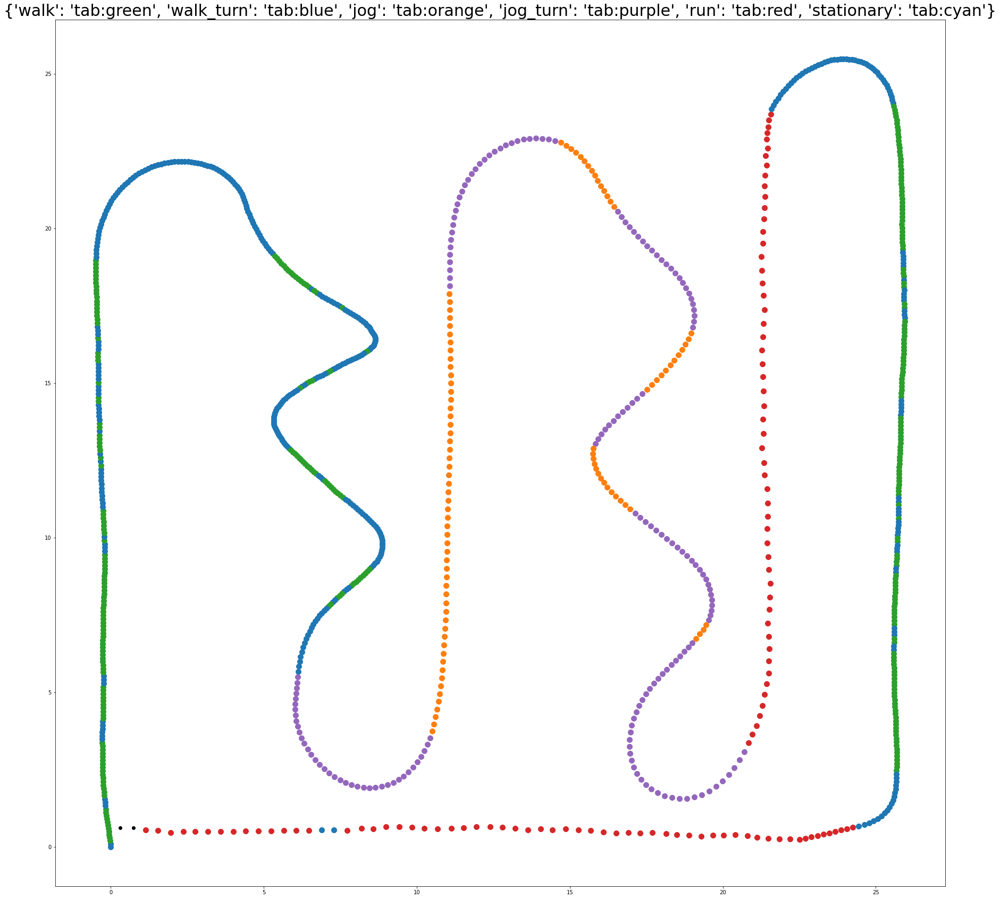

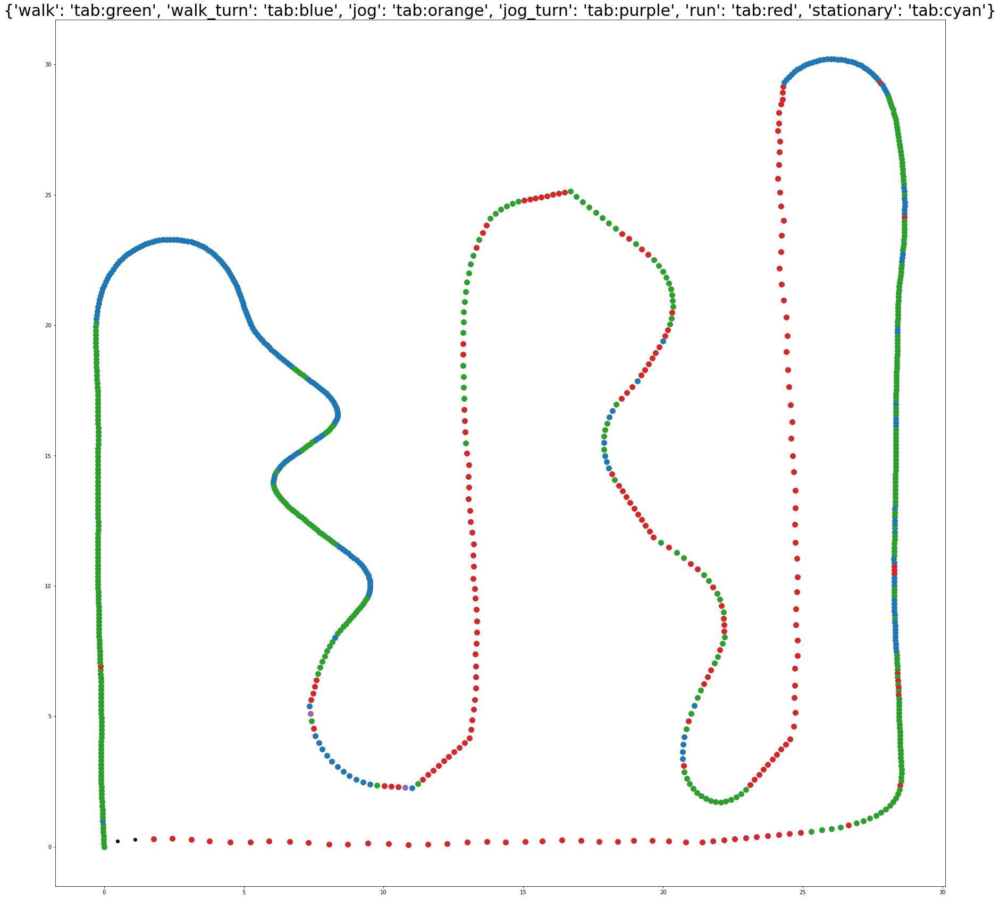

In [44]:
res = {key:0 for key in LABEL.keys()}
for i in range(len(motion_count)):
    for label in LABEL:
        res[label]+=motion_count[i][label]

for i in range(len(dfs_estimate)):
  #  plt.figure(i)
  #  show_gps_label(dfs_estimate[i].dropna(subset=['enu_x']), idx_start=0, idx_end=None, enu_format=1, annotate=False)
        
res